In [1]:
import numpy as np
import scanpy as sc
import torch
import pandas as pd
import matplotlib.pyplot as plt
from scarches.dataset.trvae.data_handling import remove_sparsity
from lataq.models import EMBEDCVAE
from sklearn.metrics import classification_report

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)
np.random.seed(420)

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
unlabeled_strat = "batch"
cells_per_ct = 2000

# Model Params
latent_dim = 10
use_mmd = False

# Training Params
alpha_epoch_anneal = 1e6
eta = 10
tau = 0
clustering_res = 0.5
labeled_loss_metric = "dist"
unlabeled_loss_metric = "dist"
class_metric = "dist"

early_stopping_kwargs = {
    "early_stopping_metric": "val_classifier_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [4]:
DATA_DIR = '../data'
adata_healthy = sc.read(
    f'{DATA_DIR}/haniffa_healthy_obsmProt.h5ad'
)
adata_disease = sc.read(
    f'{DATA_DIR}/haniffa_disease_obsmProt.h5ad'
)

In [5]:
adata = adata_healthy.concatenate(adata_disease)

In [6]:
condition_key = 'patient_id'
cell_type_key = ["initial_clustering"]
adata = adata[adata.obs[cell_type_key[0]] != 'Mono_prolif']
patients = adata.obs.patient_id.unique()
reference = np.random.choice(patients, size=80, replace=False)
query = patients[[patients[x] not in reference for x in range(len(patients))]]
adata.obs['query'] = adata.obs[condition_key].isin(query).astype('category')

Trying to set attribute `.obs` of view, copying.


In [7]:
adata_tmp = adata.copy()
sc.pp.normalize_total(adata_tmp)
sc.pp.log1p(adata_tmp)

In [8]:
sc.pp.highly_variable_genes(adata_tmp, n_top_genes=4000)
adata.var = adata_tmp.var

In [9]:
adata = adata[:, adata.var['highly_variable']]

In [10]:
source_adata = adata[adata.obs[condition_key].isin(reference)].copy()
target_adata = adata[adata.obs[condition_key].isin(query)].copy()

In [11]:
source_adata

AnnData object with n_obs × n_vars = 372618 × 4000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'batch', 'query'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'protein_expression'

In [12]:
target_adata

AnnData object with n_obs × n_vars = 274101 × 4000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'batch', 'query'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'protein_expression'

In [13]:
tranvae = EMBEDCVAE(
    adata=source_adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_key,
    hidden_layer_sizes=[128, 128, 128, 128],
    latent_dim=10,
    use_mmd=use_mmd,
)

Embedding dictionary:
 	Num conditions: 80
 	Embedding dim: 10
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 0
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Hidden Layer 3 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 10
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Hidden Layer 3 in/out: 128 128
	Output Layer in/out:  128 4000 



In [14]:
tranvae.train(
    n_epochs=100,
    early_stopping_kwargs=early_stopping_kwargs,
    pretraining_epochs=80,
    alpha_epoch_anneal=alpha_epoch_anneal,
    eta=eta,
    tau=tau,
    clustering_res=clustering_res,
    labeled_loss_metric=labeled_loss_metric,
    unlabeled_loss_metric=unlabeled_loss_metric
)

 |████████████████████| 100.0%  - val_loss: 526.1921421208 - val_trvae_loss: 520.6359385660 - val_classifier_loss: 5.5562026007 - val_labeled_loss: 0.5556202590
Saving best state of network...
Best State was in Epoch 99


In [15]:
ref_path = f'../pr/ref_model_haniffa'
tranvae.save(ref_path, overwrite=True)

In [16]:
tranvae.model.n_cell_types

17

In [17]:
data_latent = tranvae.get_latent(x=source_adata.X.A, c=source_adata.obs[condition_key])
adata_latent = sc.AnnData(data_latent)
adata_latent.obs[condition_key] = source_adata.obs[condition_key].tolist()
adata_latent.obs[cell_type_key[0]] = source_adata.obs[cell_type_key[0]].tolist()

In [18]:
landmarks = tranvae.get_landmarks_info()
full_latent = adata_latent.concatenate(landmarks, batch_key=None)

In [19]:
adata_latent_sub = sc.pp.subsample(adata_latent, n_obs=20000, copy=True)
sc.settings.verbosity = 3
sc.pp.neighbors(adata_latent_sub)
sc.tl.leiden(adata_latent_sub)
sc.tl.umap(adata_latent_sub)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)
running Leiden clustering
    finished: found 30 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)


... storing 'patient_id' as categorical
... storing 'initial_clustering' as categorical


[<AxesSubplot:title={'center':'patient_id'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'initial_clustering'}, xlabel='UMAP1', ylabel='UMAP2'>]

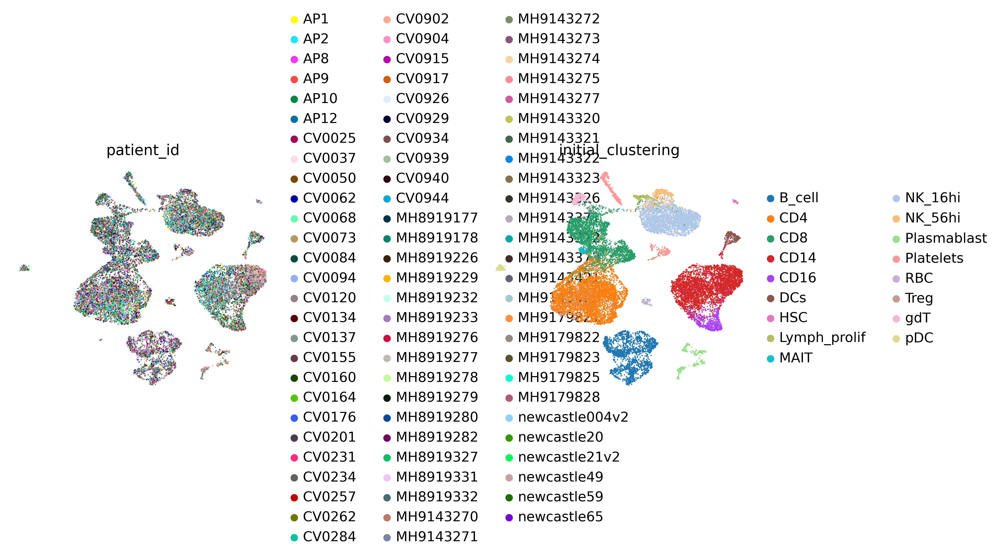

In [20]:
sc.pl.umap(adata_latent_sub,
           color=[condition_key, cell_type_key[0]],
           frameon=False,
           wspace=0.6,
           show=False
           )


In [21]:
full_latent_sub = sc.pp.subsample(full_latent, n_obs=20000, copy=True)
sc.pp.neighbors(full_latent_sub)
sc.tl.umap(full_latent_sub)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)


... storing 'patient_id' as categorical
... storing 'initial_clustering' as categorical
Trying to set attribute `.uns` of view, copying.
No handles with labels found to put in legend.


Text(0.5, 1.0, 'Landmarks')

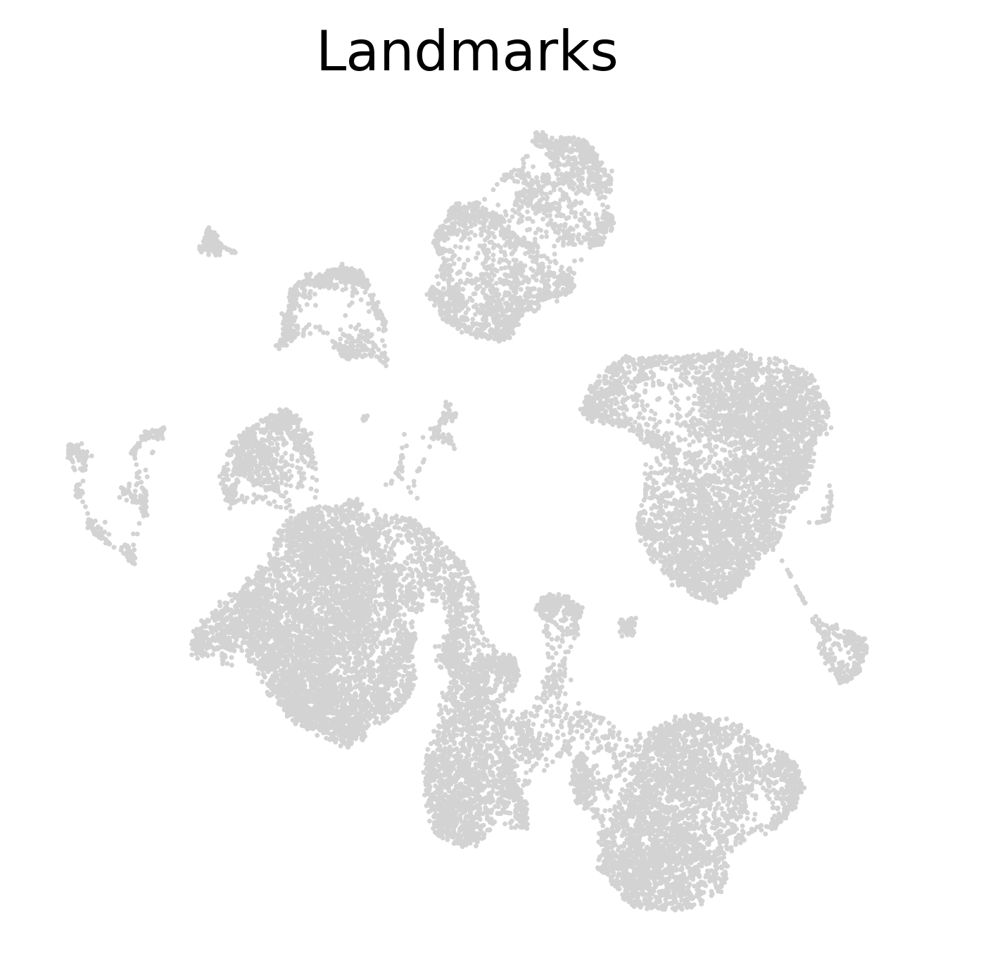

In [22]:
fig, ax = plt.subplots(1, 1)
sc.pl.umap(full_latent_sub, ax=ax, show=False)
sc.pl.umap(
    full_latent_sub[full_latent_sub.obs[condition_key].str.contains('Landmark')],
    size=100,
    color=cell_type_key[0],
    ax=ax,
    frameon=False,
    show=False
)
ax.set_title('Landmarks')

In [23]:
adata_sub = sc.pp.subsample(adata, n_obs=20000, copy=True)
sc.pp.neighbors(adata_sub)
sc.tl.leiden(adata_sub)
sc.tl.umap(adata_sub)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
running Leiden clustering
    finished: found 27 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


... storing 'sample_id' as categorical
... storing 'full_clustering' as categorical
... storing 'Resample' as categorical
... storing 'Collection_Day' as categorical
... storing 'Age_interval' as categorical
... storing 'Swab_result' as categorical
... storing 'Status' as categorical
... storing 'Smoker' as categorical
... storing 'Status_on_day_collection' as categorical
... storing 'Status_on_day_collection_summary' as categorical
... storing 'Days_from_onset' as categorical
... storing 'Site' as categorical
... storing 'time_after_LPS' as categorical
... storing 'Worst_Clinical_Status' as categorical
... storing 'Outcome' as categorical
... storing 'patient_id' as categorical


the obs value 'patient_id' has more than 103 categories. Uniform 'grey' color will be used for all categories.


[<AxesSubplot:title={'center':'patient_id'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'query'}, xlabel='UMAP1', ylabel='UMAP2'>]

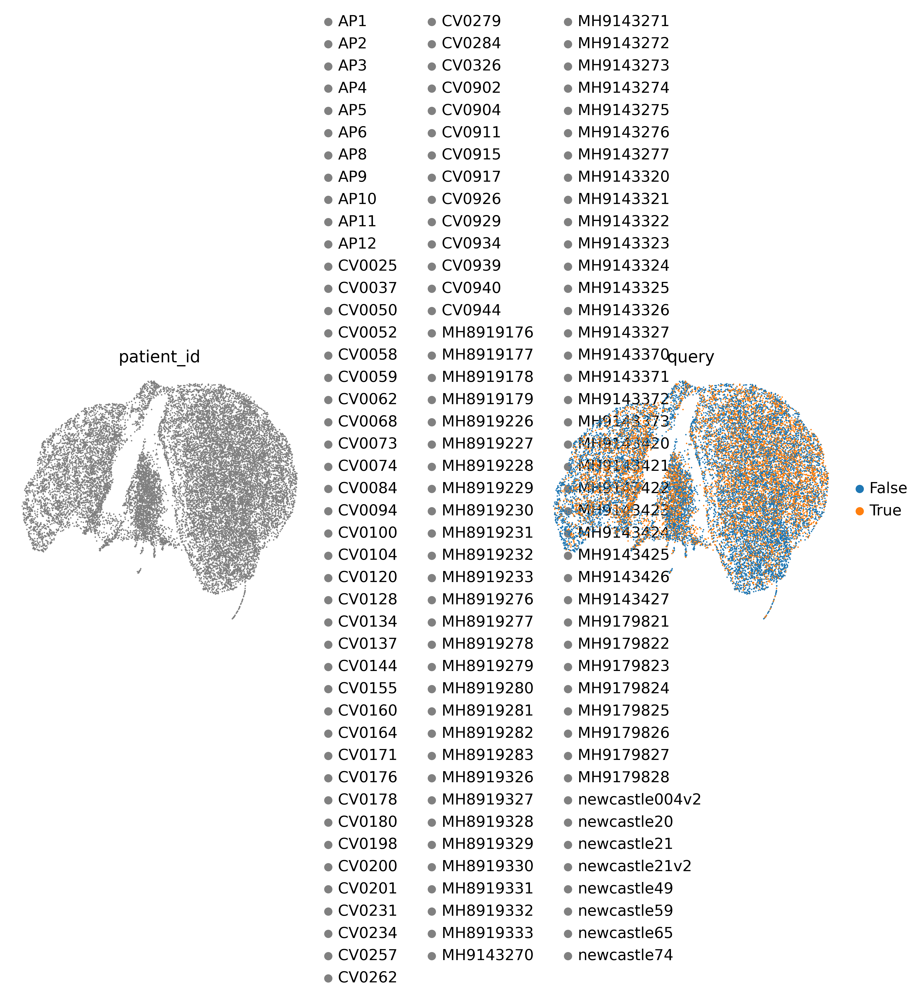

In [24]:
sc.pl.umap(adata_sub,
           color=[condition_key, 'query'],
           frameon=False,
           wspace=0.6,
           show=False
           )

In [25]:
tranvae_query = EMBEDCVAE.load_query_data(
    adata=target_adata,
    reference_model=f'../pr/ref_model_haniffa',
    labeled_indices=[],
)

AnnData object with n_obs × n_vars = 274101 × 4000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'batch', 'query'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'protein_expression'
Embedding dictionary:
 	Num conditions: 130
 	Embedding dim: 10
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 0
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Hidden Layer 3 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 10
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Hidden Layer 3 in/out: 128 128
	Out

In [26]:
tranvae_query.train(
    n_epochs=50,
    early_stopping_kwargs=early_stopping_kwargs,
    pretraining_epochs=40,
    eta=eta,
    tau=tau,
    weight_decay=0,
    clustering_res=clustering_res,
    labeled_loss_metric=labeled_loss_metric,
    unlabeled_loss_metric=unlabeled_loss_metric
)

 |████████████████----| 80.0%  - val_loss: 931.6918320767 - val_trvae_loss: 931.6918320767
Initializing unlabeled landmarks with Leiden-Clustering with an unknown number of clusters.
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:04:01)
Leiden Clustering succesful. Found 25 clusters.
 |████████████████████| 100.0%  - val_loss: 931.8515576740 - val_trvae_loss: 931.8512970680 - val_classifier_loss: 0.0002592037 - val_unlabeled_loss: 0.0259203704
Saving best state of network...
Best State was in Epoch 46


In [ ]:
data_latent = tranvae_query.get_latent(
    x=adata.X.A,
    c=adata.obs[condition_key]
)

In [ ]:
adata_latent_wquery = sc.AnnData(data_latent)
adata_latent_wquery.obs[condition_key] = adata.obs[condition_key].tolist()
adata_latent_wquery.obs[cell_type_key[0]] = adata.obs[cell_type_key[0]].tolist()
adata_latent_wquery.obs['query'] = adata.obs['query'].tolist()
adata_latent_wquery.obs['query'] = adata_latent_wquery.obs['query'].astype('category')



In [ ]:
adata_latent_wquery_sub = sc.pp.subsample(adata_latent_wquery, n_obs=100000, copy=True)
sc.pp.neighbors(adata_latent_wquery_sub)
sc.tl.leiden(adata_latent_wquery_sub)
sc.tl.umap(adata_latent_wquery_sub)


In [ ]:
sc.pl.umap(adata_latent_wquery_sub,
           color=[condition_key, 'query'],
           frameon=False,
           wspace=0.6,
           show=False
           )

In [32]:
results_dict = tranvae_query.classify(adata.X.A, adata.obs[condition_key], metric=class_metric)
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key[i]]['preds']
    probs = results_dict[cell_type_key[i]]['probs']
    results_dict[cell_type_key[i]]['report'] = classification_report(
        y_true=adata.obs[cell_type_key[i]], 
        y_pred=preds,
        output_dict=True
    )

    correct_probs = probs[preds == adata.obs[cell_type_key[i]]]
    incorrect_probs = probs[preds != adata.obs[cell_type_key[i]]]
    data = [correct_probs, incorrect_probs]

    checks = np.array(len(adata) * ['incorrect'])
    checks[preds == adata.obs[cell_type_key[i]]] = 'correct'
    adata_latent_wquery.obs[cell_type_key[i]] = adata.obs[cell_type_key[i]].tolist()
    adata_latent_wquery.obs[f'{cell_type_key[i]}_pred'] = preds.tolist()
    adata_latent_wquery.obs[f'{cell_type_key[i]}_bool'] = checks.tolist()
    


In [33]:
results_dict = tranvae_query.classify(target_adata.X.A, target_adata.obs[condition_key], metric=class_metric)
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key[i]]['preds']
    probs = results_dict[cell_type_key[i]]['probs']
    results_dict[cell_type_key[i]]['report'] = classification_report(
        y_true=target_adata.obs[cell_type_key[i]], 
        y_pred=preds,
        output_dict=True
    )

In [34]:
results_dict[cell_type_key[0]]['report']


{'B_cell': {'precision': 0.9985539959088665,
  'recall': 0.9990120320383896,
  'f1-score': 0.9987829614604463,
  'support': 28341},
 'CD14': {'precision': 0.9689936009307737,
  'recall': 0.9716313435737897,
  'f1-score': 0.9703106796116504,
  'support': 51430},
 'CD16': {'precision': 0.8731848983543078,
  'recall': 0.8360453141091658,
  'f1-score': 0.8542116062503288,
  'support': 9710},
 'CD4': {'precision': 0.9110636919618191,
  'recall': 0.8903846869995904,
  'f1-score': 0.9006055013042291,
  'support': 53706},
 'CD8': {'precision': 0.9331320213936587,
  'recall': 0.7616660400217237,
  'f1-score': 0.8387252590539499,
  'support': 47874},
 'DCs': {'precision': 0.8843073272026105,
  'recall': 0.9802696481420585,
  'f1-score': 0.9298190892077355,
  'support': 3041},
 'HSC': {'precision': 0.98068669527897,
  'recall': 0.9956427015250545,
  'f1-score': 0.9881081081081082,
  'support': 1377},
 'Lymph_prolif': {'precision': 0.2077084691733681,
  'recall': 0.935399673735726,
  'f1-score': 0

In [37]:
sc.pl.umap(
    adata_latent_wquery_sub,
    color=[f'{cell_type_key[0]}_pred', f'{cell_type_key[0]}_bool'],
    wspace=0.6,
    frameon=False
)

KeyError: 'Could not find key initial_clustering_pred in .var_names or .obs.columns.'

<Figure size 2560x800 with 0 Axes>

In [38]:
f1 = list()
prec = list()
recall = list()
for key in list(results_dict[cell_type_key[0]]['report'].keys())[:-4]:
    print(key)
    f1.append(results_dict[cell_type_key[0]]['report'][key]['f1-score'])
    prec.append(results_dict[cell_type_key[0]]['report'][key]['precision'])
    recall.append(results_dict[cell_type_key[0]]['report'][key]['recall'])

B_cell
CD14
CD16
CD4
CD8
DCs
HSC
Lymph_prolif
MAIT
NK_16hi
NK_56hi
Plasmablast
Platelets
RBC
Treg
gdT


/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'F1 score')

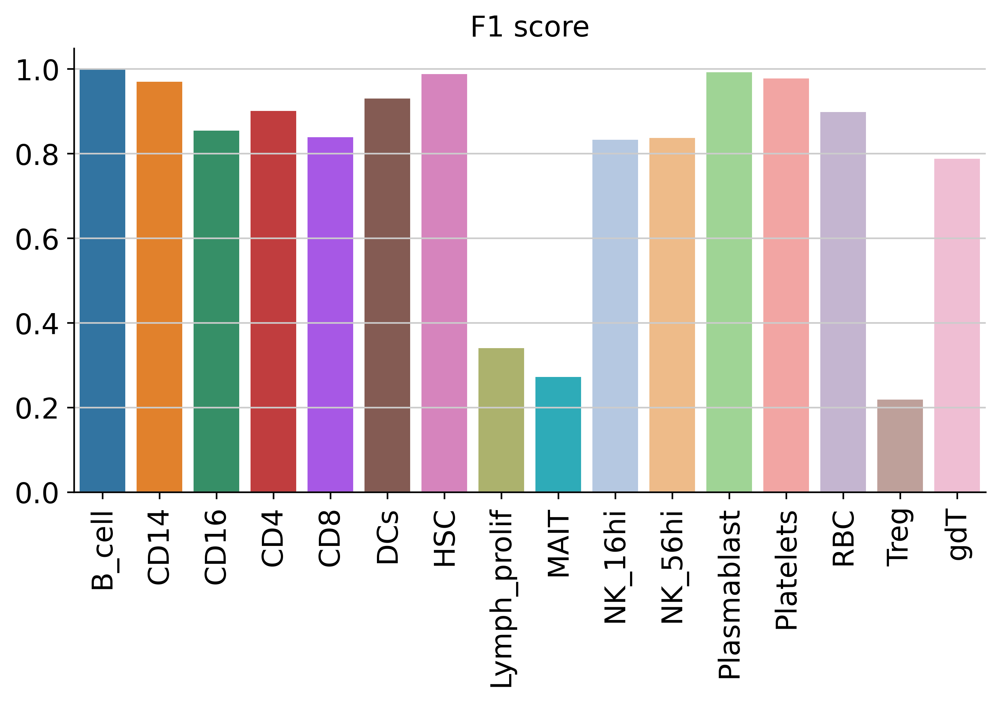

In [39]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.barplot(
    list(results_dict[cell_type_key[0]]['report'].keys())[:-4],
    f1,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('F1 score')

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'precision')

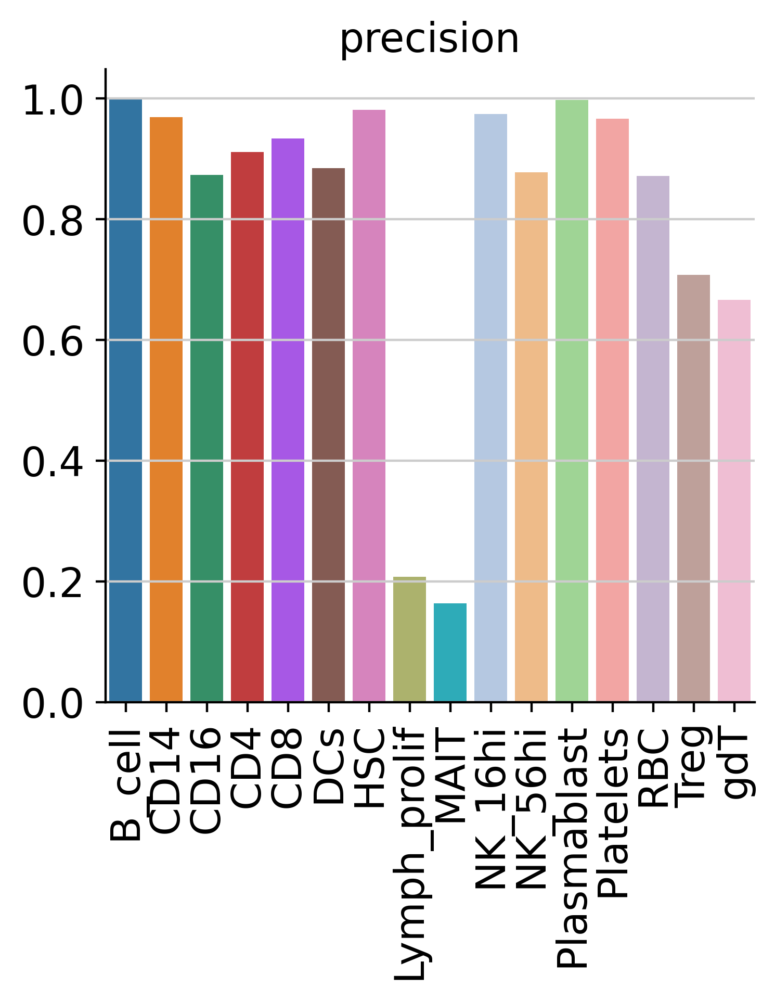

In [40]:
import seaborn as sns
fig, ax = plt.subplots(1, 1)
sns.barplot(
    list(results_dict[cell_type_key[0]]['report'].keys())[:-4],
    prec,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('precision')

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'recall')

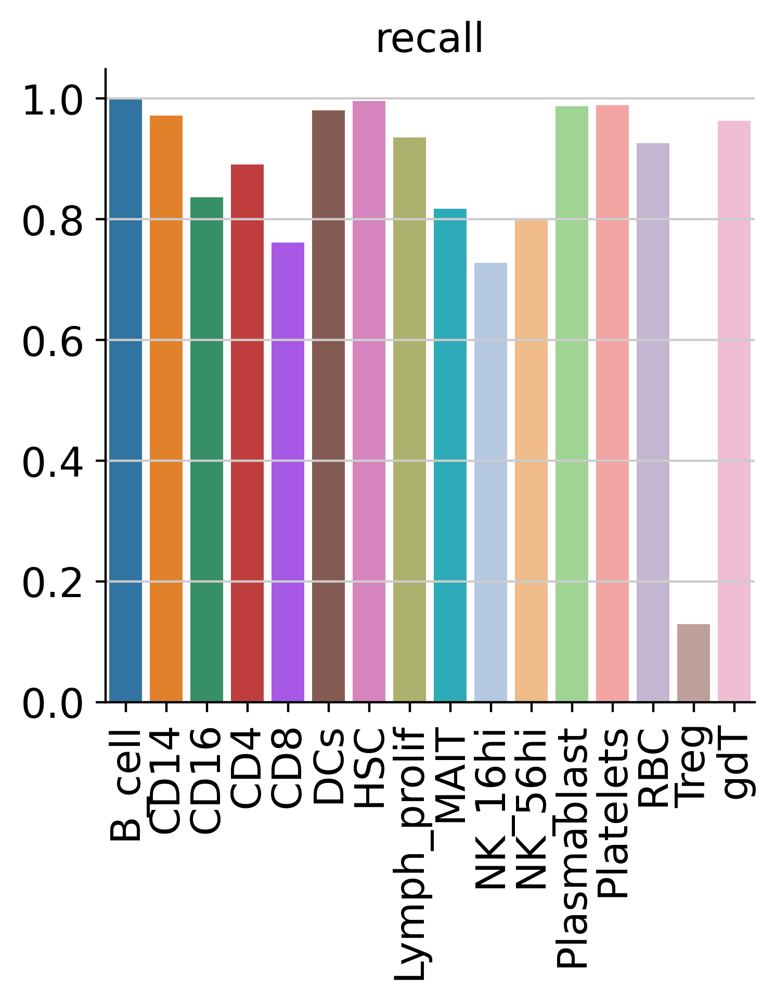

In [41]:
import seaborn as sns
fig, ax = plt.subplots(1, 1)
sns.barplot(
    list(results_dict[cell_type_key[0]]['report'].keys())[:-4],
    recall,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('recall')

In [42]:
embedding = tranvae_query.model.embedding.weight.detach().cpu().numpy()


In [64]:
from sklearn.metrics.pairwise import cosine_similarity

In [65]:
from sklearn.decomposition import KernelPCA
cos_sim_emb = cosine_similarity(embedding)
pca = KernelPCA(kernel='precomputed', n_components=2)
emb_pca = pca.fit_transform(cos_sim_emb)


In [66]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.scatterplot(emb_pca[:, 0], emb_pca[:, 1], adata.obs[condition_key].unique(), ax=ax)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for i, c in enumerate(adata.obs[condition_key].unique()):
    ax.text(emb_pca[i, 0], emb_pca[i, 1], c)
sns.despine()

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


In [45]:
from sklearn.preprocessing import LabelEncoder
from matplotlib.lines import Line2D
enc = LabelEncoder()

In [49]:
adata.obs[condition_key] = adata.obs[condition_key].astype('category')
adata.obs[condition_key] = adata.obs[condition_key].cat.reorder_categories(tranvae_query.conditions_)


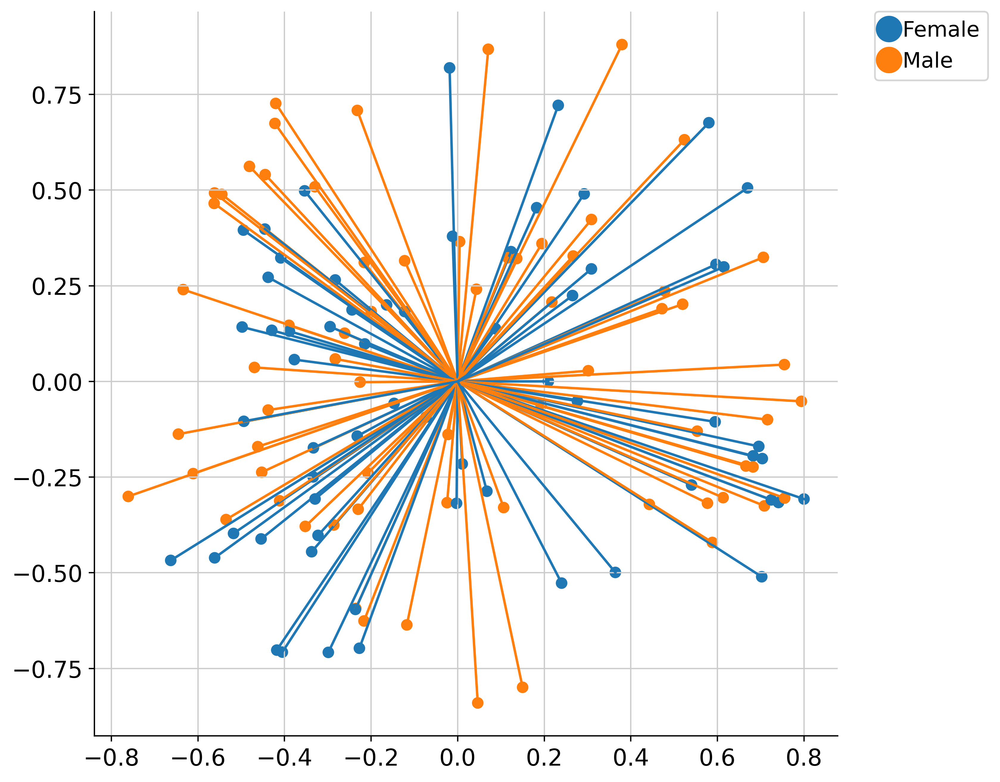

In [67]:
cond_1 = 'Sex'
palette = np.array(sns.color_palette(as_cmap=False))
palette_idx = (
    enc.fit_transform(
        adata.obs.groupby(condition_key)[cond_1].first()
    )
)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    c=palette[palette_idx]
)
handles = [
    Line2D(
        [0], 
        [0], 
        marker='o', 
        color=palette[i], 
        label=enc.classes_[i],
        markersize=15
    ) for i in range(len(enc.classes_))
    ]
ax.legend(
    handles=handles,
    bbox_to_anchor=(1.05, 1), 
    loc=2, 
    borderaxespad=0.
)

for i, c in enumerate(tranvae_query.conditions_):
    ax.plot(
        [0, emb_pca[i, 0]], 
        [0, emb_pca[i, 1]], 
        color=palette[palette_idx[i]]
    )
    #ax.text(
    #    emb_pca[i, 0], 
    #    emb_pca[i, 1],
    #    c
    #)
sns.despine()

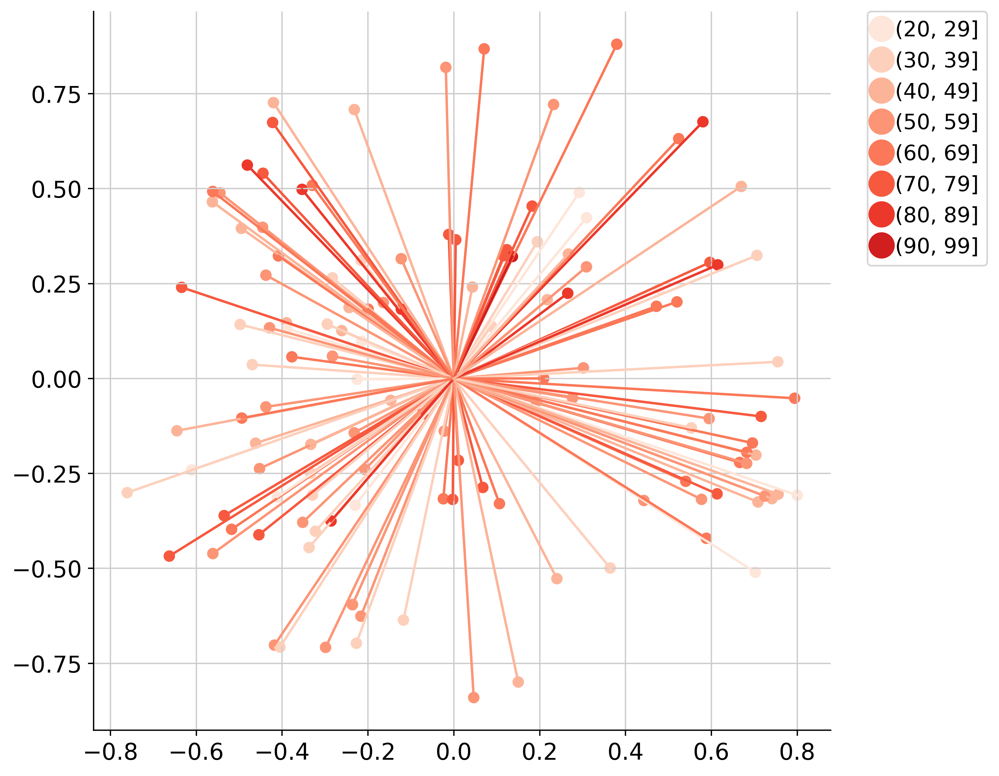

In [68]:
cond_1 = 'Age_interval'
palette = np.array(sns.color_palette('Reds', 10, as_cmap=False))
palette_idx = (
    enc.fit_transform(
        adata.obs.groupby(condition_key)[cond_1].first()
    )
)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    c=palette[palette_idx]
)
handles = [
    Line2D(
        [0], 
        [0], 
        marker='o', 
        color=palette[i], 
        label=enc.classes_[i],
        markersize=15
    ) for i in range(len(enc.classes_))
    ]
ax.legend(
    handles=handles,
    bbox_to_anchor=(1.05, 1), 
    loc=2, 
    borderaxespad=0.
)

for i, c in enumerate(tranvae_query.conditions_):
    ax.plot(
        [0, emb_pca[i, 0]], 
        [0, emb_pca[i, 1]], 
        color=palette[palette_idx[i]]
    )
    #ax.text(
    #    emb_pca[i, 0], 
    #    emb_pca[i, 1],
    #    c
    #)
sns.despine()

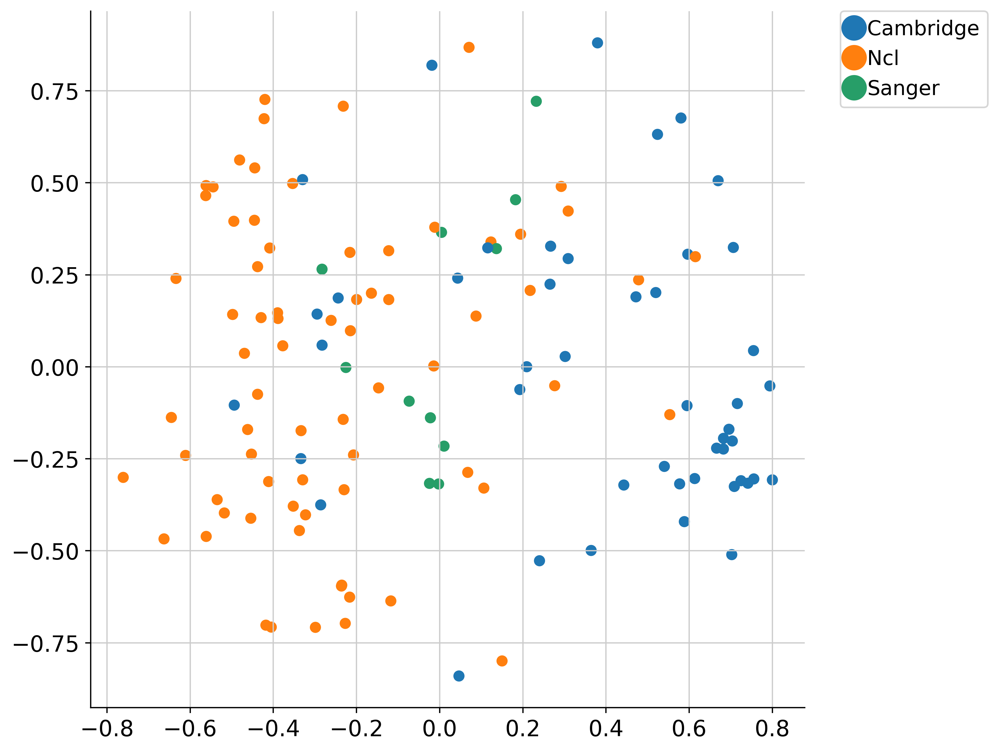

In [72]:
cond_1 = 'Site'
palette = np.array(sns.color_palette(as_cmap=False))
palette_idx = (
    enc.fit_transform(
        adata.obs.groupby(condition_key)[cond_1].first()
    )
)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    c=palette[palette_idx]
)
handles = [
    Line2D(
        [0], 
        [0], 
        marker='o', 
        color=palette[i], 
        label=enc.classes_[i],
        markersize=15
    ) for i in range(len(enc.classes_))
    ]
ax.legend(
    handles=handles,
    bbox_to_anchor=(1.05, 1), 
    loc=2, 
    borderaxespad=0.
)

#for i, c in enumerate(tranvae_query.conditions_):
    #ax.plot(
    #    [0, emb_pca[i, 0]], 
    #    [0, emb_pca[i, 1]], 
    #    color=palette[palette_idx[i]]
    #)
    #ax.text(
    #    emb_pca[i, 0], 
    #    emb_pca[i, 1],
    #    c
    #)
sns.despine()

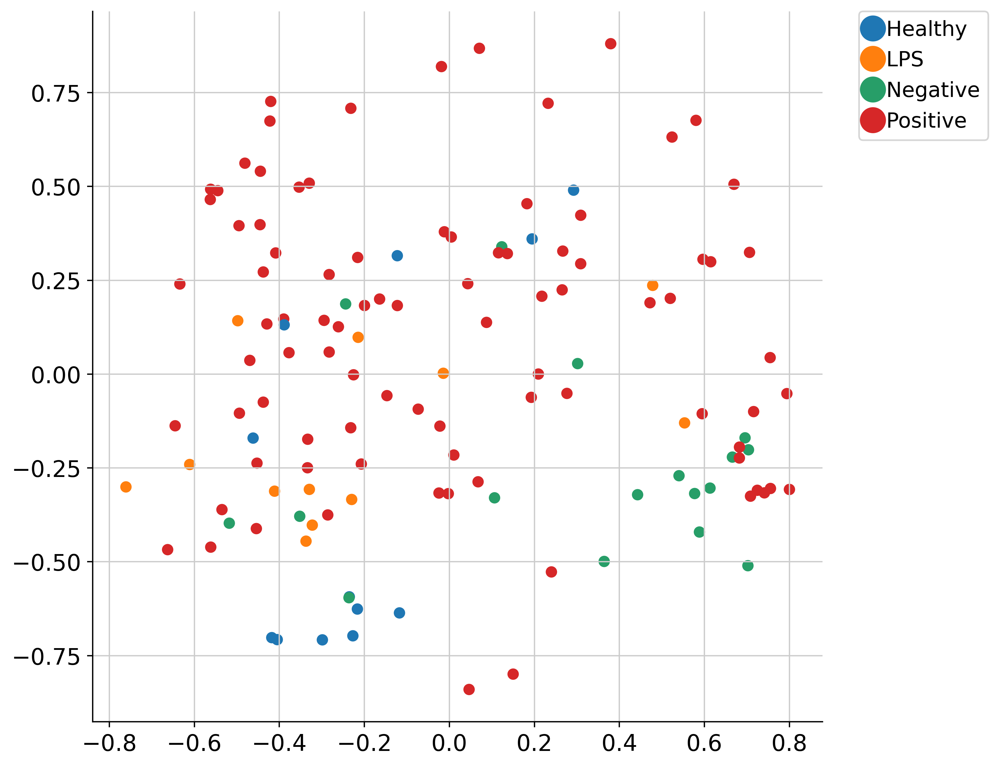

In [73]:
cond_1 = 'Swab_result'
palette = np.array(sns.color_palette(as_cmap=False))
palette_idx = (
    enc.fit_transform(
        adata.obs.groupby(condition_key)[cond_1].first()
    )
)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    c=palette[palette_idx]
)
handles = [
    Line2D(
        [0], 
        [0], 
        marker='o', 
        color=palette[i], 
        label=enc.classes_[i],
        markersize=15
    ) for i in range(len(enc.classes_))
    ]
ax.legend(
    handles=handles,
    bbox_to_anchor=(1.05, 1), 
    loc=2, 
    borderaxespad=0.
)

#for i, c in enumerate(tranvae_query.conditions_):
#    ax.plot(
#        [0, emb_pca[i, 0]], 
#        [0, emb_pca[i, 1]], 
#        color=palette[palette_idx[i]]
#    )
    #ax.text(
    #    emb_pca[i, 0], 
    #    emb_pca[i, 1],
    #    c
    #)
sns.despine()

In [74]:
tranvae_query.model

EmbedCVAE(
  (embedding): Embedding(130, 10)
  (encoder): Encoder(
    (FC): Sequential(
      (L0): CondLayers(
        (expr_L): Linear(in_features=4000, out_features=128, bias=True)
      )
      (N0): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A0): ReLU()
      (L1): Linear(in_features=128, out_features=128, bias=True)
      (N1): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A1): ReLU()
      (L2): Linear(in_features=128, out_features=128, bias=True)
      (N2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A2): ReLU()
      (L3): Linear(in_features=128, out_features=128, bias=True)
      (N3): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A3): ReLU()
    )
    (mean_encoder): Linear(in_features=128, out_features=10, bias=True)
    (log_var_encoder): Linear(in_features=128, out_features=10, bias=True)
  )
  (decoder): Decoder(
    (FirstL): Sequential(
      (L0): CondLayers(
        (expr_L): Linear(in_features=10